# Training YOLOv11n-seg Model for Food Recognition

This notebook trains a YOLOv11n-seg instance segmentation model on the prepared food recognition dataset. We will:
1. Install the required dependencies
2. Load a pretrained YOLOv11n-seg model
3. Configure and train the model
4. Evaluate model performance
5. Visualize results and predictions
6. Export the model for deployment

## 1. Install Dependencies

First, let's make sure we have the required packages installed.

In [1]:
# Import necessary libraries
import os
import yaml
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import torch
import cv2
from tqdm.notebook import tqdm

## 2. Setup Configuration

Define paths and load dataset configuration from the YAML file created during data preparation.

In [2]:
# Define paths
DATASET_DIR = Path("/home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset")
YAML_PATH = DATASET_DIR / "dataset.yaml"
OUTPUT_DIR = Path("/home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model")

# Load dataset configuration
with open(YAML_PATH, 'r') as f:
    dataset_config = yaml.safe_load(f)

# Print dataset information
print(f"Dataset path: {dataset_config['path']}")
print(f"Training images: {dataset_config['train']}")
print(f"Validation images: {dataset_config['val']}")
print(f"Number of classes: {len(dataset_config['names'])}")
print("\nClasses:")
for idx, name in dataset_config['names'].items():
    print(f"  {idx}: {name}")

# Check CUDA availability
print(f"\nCUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
    
# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"\nOutput directory: {OUTPUT_DIR}")

Dataset path: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset
Training images: train/images
Validation images: val/images
Number of classes: 498

Classes:
  0: bread-wholemeal
  1: jam
  2: water
  3: bread-sourdough
  4: banana
  5: soft-cheese
  6: ham-raw
  7: hard-cheese
  8: cottage-cheese
  9: bread-half-white
  10: coffee-with-caffeine
  11: fruit-salad
  12: pancakes
  13: tea
  14: salmon-smoked
  15: avocado
  16: spring-onion-scallion
  17: ristretto-with-caffeine
  18: ham
  19: egg
  20: bacon-frying
  21: chips-french-fries
  22: juice-apple
  23: chicken
  24: tomato-raw
  25: broccoli
  26: shrimp-boiled
  27: beetroot-steamed-without-addition-of-salt
  28: carrot-raw
  29: chickpeas
  30: french-salad-dressing
  31: pasta-hornli
  32: sauce-cream
  33: meat-balls
  34: pasta
  35: tomato-sauce
  36: cheese
  37: pear
  38: cashew-nut
  39: almonds
  40: lentils
  41: mixed-vegetables
  42: peanut-butter
  43: apple
  44: blueberries
  45: cucumber


## 3. Load Pretrained Model

We'll use the pretrained YOLOv11n-seg model and configure it for our food recognition task.

In [4]:
from ultralytics import YOLO

# Load a pretrained YOLOv11n-seg model
model = YOLO('yolo11n-seg.pt')  # Load the smallest YOLOv11 segmentation model

# Display model information
print(f"Model: {model.type}")
print(f"Pretrained on: {model.task}")
print(f"Input size: {model.model.args['imgsz']}")

Model: <bound method Module.type of YOLO(
  (model): SegmentationModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C3k2(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, mom

## 4. Configure Training Parameters

Now, let's set up the training parameters. We'll adjust these based on our hardware capabilities and dataset specifics.

In [7]:
# Define training parameters
params = {
    'data': str(YAML_PATH),
    'epochs': 100,
    'patience': 5,  # Early stopping patience
    'batch': 4,     # Smaller batch size to use less memory
    'imgsz': 640,   # Input image size
    'device': 0 if torch.cuda.is_available() else 'cpu',
    'workers': 4,   # Reduced number of worker threads
    'project': str(OUTPUT_DIR),
    'name': 'food_recognition',
    'pretrained': True,
    'optimizer': 'AdamW',  # SGD, Adam, AdamW, etc.
    'lr0': 0.001,         # Initial learning rate
    'lrf': 0.01,          # Final learning rate fraction
    'momentum': 0.937,    # SGD momentum
    'weight_decay': 0.0005,
    'warmup_epochs': 3.0,
    'warmup_momentum': 0.8,
    'warmup_bias_lr': 0.1,
    'box': 7.5,           # Box loss gain
    'cls': 0.5,           # Class loss gain
    'dfl': 1.5,           # Distribution focal loss gain
    'label_smoothing': 0.0,
    'nbs': 64,            # Nominal batch size
    'seed': 42,
    'augment': True,      # Enable data augmentation
    'cache': 'disk',      # Cache images on disk instead of RAM
    'rect': False,        # Rectangular training
    'resume': False,      # Resume training from last checkpoint
    'amp': True,          # Automatic Mixed Precision
    'save_period': 1,    # Save checkpoint every 10 epochs
    # 'accumulate': 4,      # Accumulate gradients over 4 batches
}

# Print key training parameters
print("Training parameters:")
for k, v in params.items():
    if k in ['data', 'epochs', 'batch', 'imgsz', 'device', 'name', 'pretrained', 'optimizer', 'lr0', 'augment', 'cache', 'accumulate']:
        print(f"  {k}: {v}")

Training parameters:
  data: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/dataset.yaml
  epochs: 100
  batch: 4
  imgsz: 640
  device: 0
  name: food_recognition
  pretrained: True
  optimizer: AdamW
  lr0: 0.001
  augment: True
  cache: disk


## 5. Train the Model

Now we'll start the training process. This may take several hours depending on your hardware.

In [8]:
# Train the model
results = model.train(**params)

# Print training results summary
print("\nTraining completed!")
print(f"Best mAP50-95: {results.fitness:.4f}")
print(f"Results saved to: {results.save_dir}")

New https://pypi.org/project/ultralytics/8.3.159 available 😃 Update with 'pip install -U ultralytics'
WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in in the future.
Ultralytics 8.3.158 🚀 Python-3.13.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 5771MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=disk, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max

train: Scanning /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/train/labels.cache... 39962 images, 0 backgrounds, 135 corrupt: 100%|██████████| 39962/39962 [00:00<?, ?it/s]

train: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/train/images/006615.jpg: 1 duplicate labels removed
train: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/train/images/006969.jpg: 1 duplicate labels removed
train: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/train/images/007050.jpg: 1 duplicate labels removed
train: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/train/images/007315.jpg: 1 duplicate labels removed
train: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/train/images/007528.jpg: 1 duplicate labels removed
train: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/train/images/007532.jpg: 2 duplicate labels removed
train: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/train/images/007742.jpg: 1 duplicate labels removed
train: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/train/images/007759.jpg: 1 d


train: Caching images (55.9GB Disk): 100%|██████████| 39827/39827 [02:52<00:00, 230.41it/s] 


val: Fast image access ✅ (ping: 0.1±0.1 ms, read: 171.7±136.9 MB/s, size: 74.8 KB)


val: Scanning /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/labels.cache... 1000 images, 0 backgrounds, 4 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/033263.jpg: 2 duplicate labels removed
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/132133.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.2958984 1.3105469]
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/132371.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.3419628 1.3464062]
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/135191.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.2883301]
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/144957.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.2412109]
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/147793.jpg: 1 duplicate labels removed



val: Caching images (1.4GB Disk): 100%|██████████| 996/996 [00:09<00:00, 107.40it/s] 


Plotting labels to /home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.25G        1.4      4.216      4.498      1.726         12        640: 100%|██████████| 9957/9957 [14:06<00:00, 11.76it/s] 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:11<00:00, 11.02it/s]


                   all        996       1817    0.00297       0.25      0.014    0.00899    0.00209      0.173     0.0104     0.0056

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100       2.3G      1.347      4.039      3.816      1.663         15        640: 100%|██████████| 9957/9957 [13:17<00:00, 12.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.48it/s]


                   all        996       1817      0.715     0.0449     0.0496      0.036      0.713     0.0391     0.0439     0.0255

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100       2.3G      1.303       3.95      3.556      1.621          7        640: 100%|██████████| 9957/9957 [13:12<00:00, 12.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.40it/s]


                   all        996       1817      0.696     0.0651     0.0817     0.0606      0.694     0.0589     0.0728      0.043

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100       2.3G      1.274      3.891      3.392      1.594          6        640: 100%|██████████| 9957/9957 [13:24<00:00, 12.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.43it/s]


                   all        996       1817      0.705     0.0804     0.0959     0.0692      0.705     0.0736     0.0855     0.0471

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100       2.3G      1.249      3.839      3.275      1.573          5        640: 100%|██████████| 9957/9957 [13:06<00:00, 12.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.61it/s]


                   all        996       1817      0.694      0.105      0.112     0.0803      0.704     0.0875      0.101      0.057

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100       2.3G      1.236      3.822      3.194       1.56         18        640: 100%|██████████| 9957/9957 [12:59<00:00, 12.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.63it/s]


                   all        996       1817      0.602      0.118      0.124     0.0905      0.612      0.102      0.108     0.0606

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100       2.3G      1.225      3.795      3.116      1.549          9        640: 100%|██████████| 9957/9957 [13:00<00:00, 12.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.67it/s]


                   all        996       1817      0.665      0.119      0.134     0.0999      0.658      0.103      0.116     0.0687

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100       2.3G      1.215      3.779      3.062      1.539         18        640: 100%|██████████| 9957/9957 [13:01<00:00, 12.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.66it/s]


                   all        996       1817      0.555      0.135       0.14      0.102      0.549       0.12      0.121     0.0685

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.31G      1.209      3.758      3.006      1.532          7        640: 100%|██████████| 9957/9957 [13:01<00:00, 12.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.67it/s]


                   all        996       1817       0.65      0.134      0.155      0.116      0.641       0.12      0.134     0.0778

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.32G        1.2       3.75      2.967      1.527         15        640: 100%|██████████| 9957/9957 [13:01<00:00, 12.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.70it/s]


                   all        996       1817      0.631      0.142      0.168      0.124      0.626      0.125      0.144     0.0829

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.32G       1.19      3.737      2.926      1.521          6        640: 100%|██████████| 9957/9957 [13:01<00:00, 12.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.70it/s]


                   all        996       1817      0.591       0.15      0.173      0.129      0.571      0.136      0.148     0.0856

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.32G      1.185      3.721      2.889      1.513          7        640: 100%|██████████| 9957/9957 [13:01<00:00, 12.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.70it/s]


                   all        996       1817      0.573      0.157      0.179      0.134      0.562      0.138      0.154     0.0876

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.32G      1.178      3.711      2.871      1.509          8        640: 100%|██████████| 9957/9957 [13:00<00:00, 12.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.71it/s]


                   all        996       1817       0.56      0.173      0.186      0.141      0.549       0.15      0.154     0.0894

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.32G      1.173      3.698      2.833      1.503         21        640: 100%|██████████| 9957/9957 [13:00<00:00, 12.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.70it/s]


                   all        996       1817      0.575      0.179      0.198      0.149      0.585      0.154      0.171      0.096

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.32G      1.168      3.694      2.809        1.5         12        640: 100%|██████████| 9957/9957 [12:59<00:00, 12.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.75it/s]


                   all        996       1817      0.516       0.18      0.191      0.143      0.505       0.16      0.164     0.0918

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.32G      1.171      3.689      2.795      1.502         14        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.77it/s]


                   all        996       1817      0.589      0.176      0.202      0.152      0.577      0.156      0.175     0.0982

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.32G      1.158      3.669      2.755      1.489          7        640: 100%|██████████| 9957/9957 [12:57<00:00, 12.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.75it/s]


                   all        996       1817      0.577       0.18      0.202      0.152      0.566      0.161      0.175      0.098

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.32G      1.159      3.665      2.741      1.492          5        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.74it/s]


                   all        996       1817      0.576      0.178      0.212      0.159      0.563      0.159      0.182      0.103

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.32G      1.154      3.654      2.719      1.486         12        640: 100%|██████████| 9957/9957 [12:59<00:00, 12.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.75it/s]


                   all        996       1817      0.567      0.178      0.212      0.158      0.574      0.158      0.183      0.104

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.32G      1.149      3.648      2.706      1.484         10        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.79it/s]


                   all        996       1817      0.575      0.186      0.212      0.158      0.567      0.166      0.184      0.105

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.32G      1.152      3.656      2.688      1.486          9        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.79it/s]


                   all        996       1817      0.565      0.192      0.213      0.161       0.56      0.166      0.185      0.106

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.32G      1.145      3.644      2.675      1.479          7        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.78it/s]


                   all        996       1817      0.552      0.196      0.214      0.161      0.556      0.169      0.188      0.107

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.32G      1.149      3.637      2.664      1.483         11        640: 100%|██████████| 9957/9957 [12:59<00:00, 12.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.80it/s]


                   all        996       1817      0.554      0.194      0.219      0.165      0.547      0.171      0.192      0.109

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.32G      1.141      3.632      2.645      1.478         15        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.80it/s]


                   all        996       1817      0.532      0.199      0.222      0.166      0.546      0.171      0.193       0.11

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.32G      1.135      3.626      2.622      1.473         13        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.80it/s]


                   all        996       1817      0.539        0.2      0.223      0.169      0.533      0.176      0.196      0.111

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.32G      1.135      3.627      2.617      1.473         14        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.81it/s]


                   all        996       1817      0.538      0.201      0.225      0.171      0.535      0.178      0.198      0.112

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.32G      1.134      3.622      2.603      1.471          8        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.82it/s]


                   all        996       1817      0.539      0.201      0.224      0.171      0.538      0.178      0.198      0.112

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.32G      1.133      3.614      2.587       1.47          9        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.81it/s]


                   all        996       1817      0.544      0.207      0.224       0.17      0.538       0.18      0.198      0.112

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.32G      1.127      3.618      2.576      1.465         13        640: 100%|██████████| 9957/9957 [12:59<00:00, 12.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.84it/s]


                   all        996       1817      0.539      0.211      0.225      0.171      0.568      0.176      0.199      0.113

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.32G       1.13      3.609      2.567      1.468         11        640: 100%|██████████| 9957/9957 [12:59<00:00, 12.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.82it/s]


                   all        996       1817      0.566      0.201      0.226      0.171      0.577      0.175      0.199      0.112

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.32G      1.126        3.6      2.546      1.464         10        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.80it/s]


                   all        996       1817       0.58      0.201      0.226      0.171      0.578      0.174      0.199      0.113

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.32G      1.123      3.594      2.536       1.46         10        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.86it/s]


                   all        996       1817      0.565      0.201      0.227      0.172      0.568      0.175      0.199      0.113

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.32G      1.119      3.589      2.527       1.46         10        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.85it/s]


                   all        996       1817      0.569      0.199      0.227      0.172      0.561      0.176      0.199      0.113

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.32G       1.12      3.594      2.515       1.46         12        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.83it/s]


                   all        996       1817      0.566      0.203      0.229      0.174      0.564      0.176      0.201      0.114

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.32G      1.117      3.587      2.512      1.458          8        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.85it/s]


                   all        996       1817      0.566      0.206       0.23      0.175      0.564      0.178      0.202      0.114

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.32G      1.118      3.586       2.51      1.459         20        640: 100%|██████████| 9957/9957 [12:59<00:00, 12.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.86it/s]


                   all        996       1817      0.549      0.213      0.231      0.176      0.559       0.18      0.202      0.115

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.32G      1.114      3.581       2.49      1.454         12        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.88it/s]


                   all        996       1817      0.554      0.215      0.235      0.178       0.55      0.185      0.205      0.116

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.32G      1.112      3.585      2.492      1.453         20        640: 100%|██████████| 9957/9957 [12:58<00:00, 12.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.86it/s]


                   all        996       1817      0.552      0.219      0.236      0.179      0.554      0.185      0.206      0.117

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.32G      1.111      3.572      2.477      1.454         11        640: 100%|██████████| 9957/9957 [12:59<00:00, 12.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.87it/s]


                   all        996       1817      0.554      0.219      0.237      0.179       0.55      0.189      0.207      0.117

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.32G      1.111      3.576      2.471      1.453         17        640: 100%|██████████| 9957/9957 [13:01<00:00, 12.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:10<00:00, 11.73it/s]


                   all        996       1817      0.545      0.218      0.237      0.179      0.539       0.19      0.208      0.117

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.32G      1.101      3.609      2.359      1.427         15        640:   0%|          | 31/9957 [00:02<13:33, 12.20it/s]


KeyboardInterrupt: 

## 6. Evaluate Model Performance

Let's evaluate the model on the validation set to see how well it's performing.

In [12]:
# Get the path to the best model weights
best_weights = Path("/home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2/weights/best.pt")
print(f"Best weights: {best_weights}")

# Load the best model
best_model = YOLO(best_weights)

# Evaluate on validation set
val_results = best_model.val(data=params['data'])

# Print validation results
print("\nValidation Results:")
print(f"mAP50-95: {val_results.box.map:.4f}")
print(f"mAP50: {val_results.box.map50:.4f}")
print(f"mAP75: {val_results.box.map75:.4f}")
# print(f"Precision: {val_results.box.p:.4f}")
# print(f"Recall: {val_results.box.r:.4f}")

# For segmentation
print("\nSegmentation Results:")
print(f"Mask mAP50-95: {val_results.seg.map:.4f}")
print(f"Mask mAP50: {val_results.seg.map50:.4f}")

Best weights: /home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2/weights/best.pt
Ultralytics 8.3.158 🚀 Python-3.13.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 5771MiB)
YOLO11n-seg summary (fused): 113 layers, 3,020,598 parameters, 0 gradients, 11.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 132.4±54.0 MB/s, size: 37.8 KB)


val: Scanning /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/labels.cache... 1000 images, 0 backgrounds, 4 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/033263.jpg: 2 duplicate labels removed
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/132133.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.2958984 1.3105469]
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/132371.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.3419628 1.3464062]
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/135191.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.2883301]
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/144957.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.2412109]
val: /home/kuba/Coding/Uczelnia/fridge_project/datasets/yolo_food_dataset/val/images/147793.jpg: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/63 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   2%|▏         | 1/63 [00:00<00:24,  2.49it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   3%|▎         | 2/63 [00:00<00:19,  3.18it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:09<00:00,  6.44it/s]


                   all        996       1817      0.545      0.218      0.238       0.18      0.542       0.19      0.208      0.118
       bread-wholemeal         36         36       0.22      0.833      0.277      0.206      0.118      0.444      0.078     0.0265
                   jam         21         21      0.234      0.714      0.519       0.32      0.223      0.667      0.435      0.201
                 water         74         75      0.429      0.933      0.784      0.587      0.407       0.88      0.723      0.426
       bread-sourdough          3          3          0          0     0.0308     0.0265          0          0    0.00428    0.00171
                banana          7          7      0.187      0.714      0.641      0.542      0.187      0.714       0.62       0.27
           soft-cheese          6          6      0.485      0.167      0.235      0.193      0.494      0.167      0.191      0.144
               ham-raw          6          6      0.281      0.667   

## 7. Visualize Training Results

Let's visualize the training progress and results.

In [16]:
# Path to the results CSV file
results_csv = Path("/home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2/results.csv")

import pandas as pd

# Load the results into a pandas DataFrame
results_df = pd.read_csv(results_csv)

# Plot training metrics
metrics = ['train/box_loss', 'train/seg_loss', 'train/cls_loss', 'metrics/precision', 
           'metrics/recall', 'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95',
           'val/box_loss', 'val/seg_loss', 'val/cls_loss']

fig, axs = plt.subplots(len(metrics) // 2, 2, figsize=(15, 15))
axs = axs.flatten()

for i, metric in enumerate(metrics):
    if i < len(axs) and metric in results_df.columns:
        axs[i].plot(results_df['epoch'], results_df[metric])
        axs[i].set_title(metric)
        axs[i].set_xlabel('Epoch')
        
plt.tight_layout()
plt.savefig("t.jpg")
plt.show()

# Confusion Matrix (if available)
# confusion_matrix_path = list(Path(results.save_dir).glob('*_confusion_matrix.png'))
# if confusion_matrix_path:
#     from IPython.display import Image, display
#     display(Image(str(confusion_matrix_path[0])))

<Figure size 1500x1500 with 10 Axes>

## 8. Visualize Predictions on Test Images

Now let's use our trained model to make predictions on some test images and visualize the results.

In [17]:
# Define the path to test images
TEST_DIR = Path("/home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/test/images")

# Get a list of test images
test_images = list(TEST_DIR.glob('*.jpg'))
if not test_images:
    test_images = list(TEST_DIR.glob('*.png'))

# Sample a few test images
import random
sample_images = random.sample(test_images, min(5, len(test_images)))

# Make predictions and visualize
for img_path in sample_images:
    # Run inference
    results = best_model(img_path, conf=0.25)
    
    # Plot results
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))
    
    # Original image
    img = Image.open(img_path)
    ax[0].imshow(img)
    ax[0].set_title('Original Image')
    ax[0].axis('off')
    
    # Predicted image
    res_plotted = results[0].plot()
    res_plotted_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
    ax[1].imshow(res_plotted_rgb)
    ax[1].set_title('Predictions')
    ax[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print prediction details
    print(f"Image: {img_path.name}")
    for i, det in enumerate(results[0].boxes):
        label = results[0].names[int(det.cls)]
        conf = float(det.conf)
        print(f"  Detection {i+1}: {label} (Confidence: {conf:.2f})")
    print("-" * 50)


image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/test/images/179337.jpg: 640x640 (no detections), 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1600x800 with 2 Axes>

Image: 179337.jpg
--------------------------------------------------

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/test/images/135348.jpg: 640x640 2 bread-whites, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 8.1ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1600x800 with 2 Axes>

Image: 135348.jpg
  Detection 1: bread-white (Confidence: 0.48)
  Detection 2: bread-white (Confidence: 0.29)
--------------------------------------------------

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/test/images/182007.jpg: 640x640 (no detections), 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1600x800 with 2 Axes>

Image: 182007.jpg
--------------------------------------------------

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/test/images/180338.jpg: 640x640 1 birchermuesli-prepared-no-sugar-added, 6.4ms
Speed: 1.5ms preprocess, 6.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1600x800 with 2 Axes>

Image: 180338.jpg
  Detection 1: birchermuesli-prepared-no-sugar-added (Confidence: 0.29)
--------------------------------------------------

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/test/images/177294.jpg: 640x640 1 chips-french-fries, 6.5ms
Speed: 1.5ms preprocess, 6.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1600x800 with 2 Axes>

Image: 177294.jpg
  Detection 1: chips-french-fries (Confidence: 0.34)
--------------------------------------------------


## 9. Export the Model

Let's export the model for deployment in different formats.

In [18]:
# Export to different formats
formats = ['torchscript', 'onnx', 'openvino']

for format_type in formats:
    try:
        exported_model = best_model.export(format=format_type)
        print(f"Model exported to {format_type} format: {exported_model}")
    except Exception as e:
        print(f"Failed to export to {format_type} format: {e}")

# Copy the best model to a convenient location
import shutil
final_model_path = Path("/home/kuba/Coding/Uczelnia/fridge_project/food_segmentation_model.pt")
shutil.copy(best_weights, final_model_path)
print(f"Final model saved to: {final_model_path}")

Ultralytics 8.3.158 🚀 Python-3.13.3 torch-2.7.1+cu126 CPU (AMD Ryzen 7 7735HS with Radeon Graphics)

PyTorch: starting from '/home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 534, 8400), (1, 32, 160, 160)) (17.9 MB)

TorchScript: starting export with torch 2.7.1+cu126...
TorchScript: export success ✅ 1.4s, saved as '/home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2/weights/best.torchscript' (12.1 MB)

Export complete (1.6s)
Results saved to /home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2/weights
Predict:         yolo predict task=segment model=/home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2/weights/best.torchscript imgsz=640  
Validate:        yolo val task=segment model=/home/kuba/Coding/Uczelnia/fridge_project/runs/food_seg_model/food_recognition2/weights/best.torchscript imgsz=640 

## 10. Model Usage Example

Here's an example of how to use the trained model for inference in production.

In [ ]:
# Example code for using the model in production
print("""
# Example: Using the trained model for inference

from ultralytics import YOLO
import cv2
from PIL import Image

# Load the model
model = YOLO('/home/kuba/Coding/Uczelnia/fridge_project/food_segmentation_model.pt')

# Function for inference on an image
def detect_food(image_path):
    # Run inference
    results = model(image_path, conf=0.25)
    
    # Process results
    detections = []
    for r in results:
        for i, (box, mask, cls, conf) in enumerate(zip(r.boxes.xyxy, r.masks.xy, r.boxes.cls, r.boxes.conf)):
            class_name = model.names[int(cls)]
            detections.append({
                'class': class_name,
                'confidence': float(conf),
                'bbox': box.tolist(),
                'mask': mask.tolist()  # Polygon points of the segmentation mask
            })
    
    return detections, results[0].plot()  # Return both data and visualization

# Example usage
image_path = 'path/to/your/image.jpg'
detections, vis_image = detect_food(image_path)

# Display results
for i, det in enumerate(detections):
    print(f"Detection {i+1}: {det['class']} (Confidence: {det['confidence']:.2f})")

# Save or display the visualization
cv2.imwrite('result.jpg', vis_image)
""")

In [13]:
from ultralytics import YOLO
import cv2
from PIL import Image
import os

# Load the model
model = YOLO('/home/kuba/Coding/Uczelnia/fridge_project/food_segmentation_model.pt')

# Function for inference on an image
def detect_food(image_path):
    # Run inference
    results = model(image_path, conf=0.25)
    
    # Process results
    detections = []
    for r in results:
        # Check if masks exist
        has_masks = hasattr(r, 'masks') and r.masks is not None and len(r.masks) > 0
        
        # Process each detection
        for i, (box, cls, conf) in enumerate(zip(r.boxes.xyxy, r.boxes.cls, r.boxes.conf)):
            class_name = model.names[int(cls)]
            detection_data = {
                'class': class_name,
                'confidence': float(conf),
                'bbox': box.tolist(),
            }
            
            # Add mask if available
            if has_masks and i < len(r.masks):
                detection_data['mask'] = r.masks[i].xy  # Polygon points of the segmentation mask
                
            detections.append(detection_data)
    
    return detections, results[0].plot()  # Return both data and visualization


photo_name = "onion2.png"

# Save or display the visualization
fridge_path = os.path.join("..", "datasets", "fridge_testing")
image_path = os.path.join(fridge_path, photo_name)
detections, vis_image = detect_food(image_path)

# Display results
for i, det in enumerate(detections):
    print(f"Detection {i+1}: {det['class']} (Confidence: {det['confidence']:.2f})")

# Save or display the visualization
cv2.imwrite(f'result-{photo_name.split('.')[0]}.jpg', vis_image)


image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/food-recognition-2022/../datasets/fridge_testing/onion2.png: 640x480 (no detections), 125.7ms
Speed: 6.2ms preprocess, 125.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


True

Found 1000 test images

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/val/images/147560.jpg: 640x640 (no detections), 170.9ms
Speed: 3.5ms preprocess, 170.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


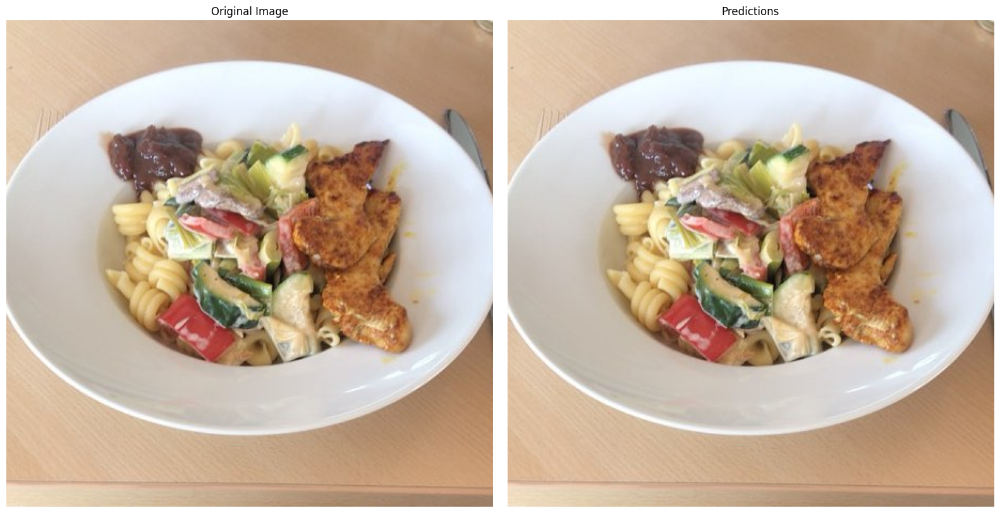

Image: 147560.jpg
--------------------------------------------------

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/val/images/107115.jpg: 640x640 (no detections), 156.2ms
Speed: 3.8ms preprocess, 156.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


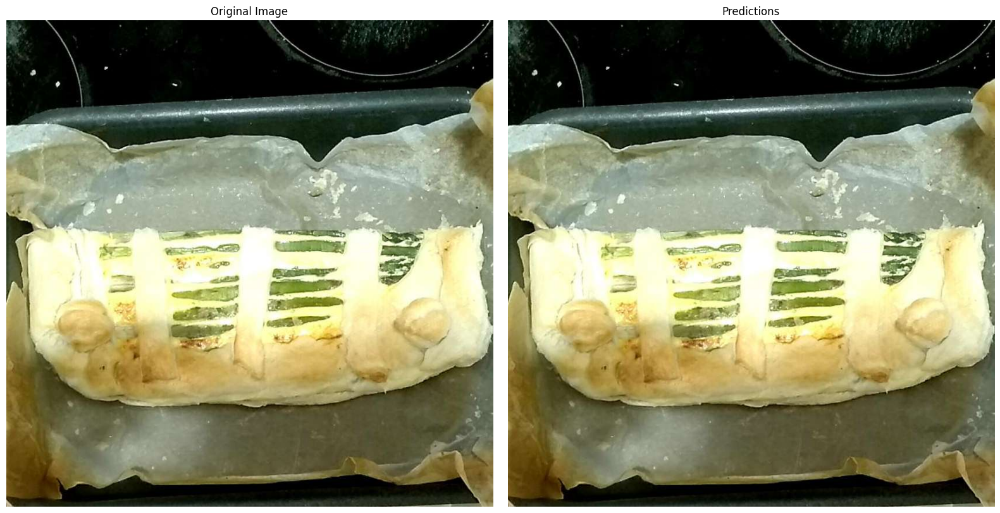

Image: 107115.jpg
--------------------------------------------------

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/val/images/182105.jpg: 640x640 1 blueberries, 1 salami, 123.8ms
Speed: 3.9ms preprocess, 123.8ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


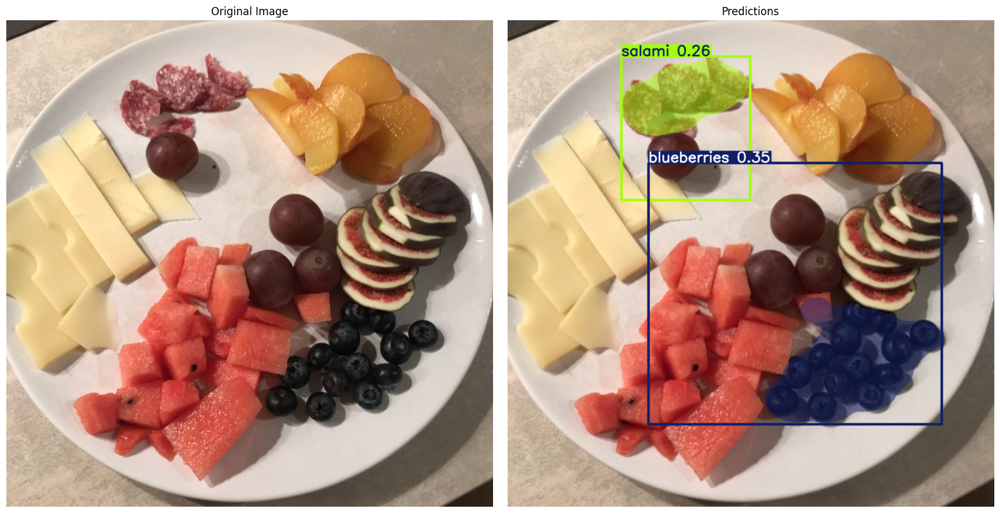

Image: 182105.jpg
  Detection 1: blueberries (Confidence: 0.35)
  Detection 2: salami (Confidence: 0.26)


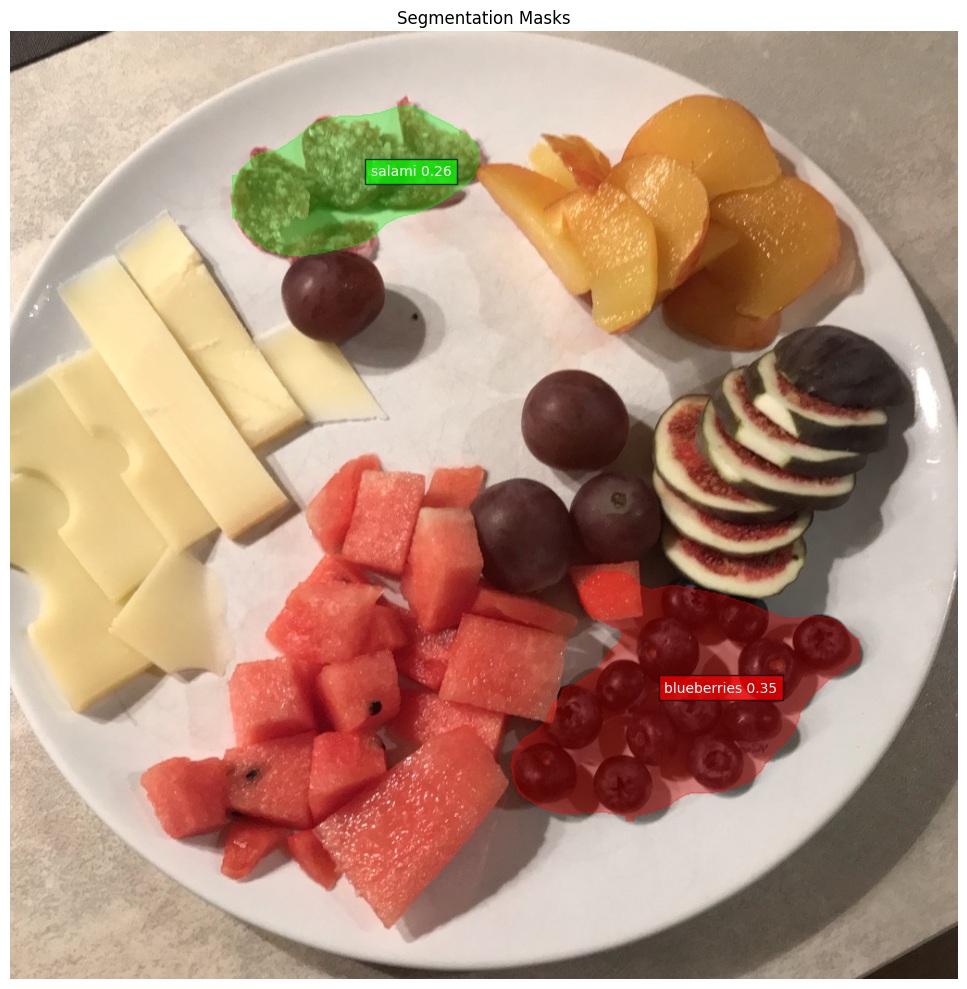

--------------------------------------------------

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/val/images/144957.jpg: 640x480 1 chips-french-fries, 67.8ms
Speed: 2.6ms preprocess, 67.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


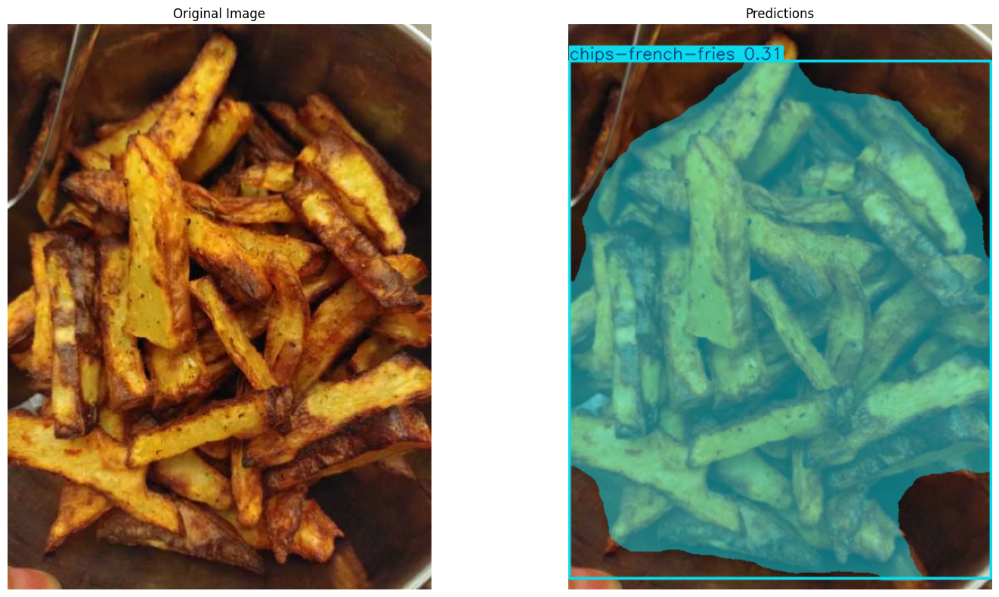

Image: 144957.jpg
  Detection 1: chips-french-fries (Confidence: 0.31)


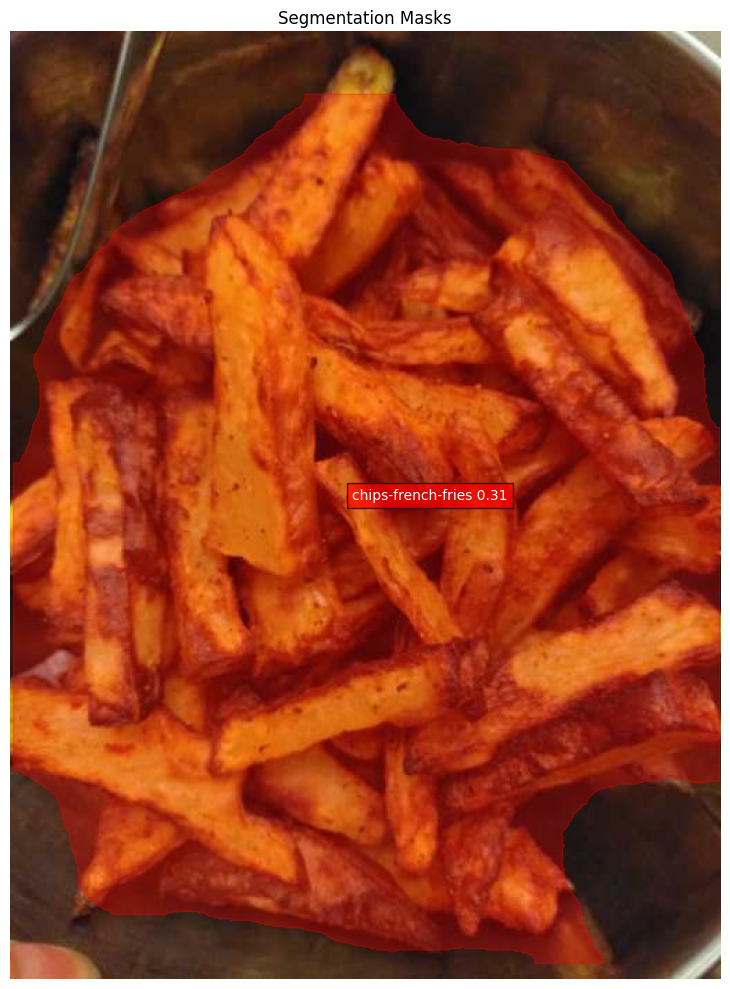

--------------------------------------------------

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/val/images/160632.jpg: 640x640 1 water, 59.2ms
Speed: 1.2ms preprocess, 59.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


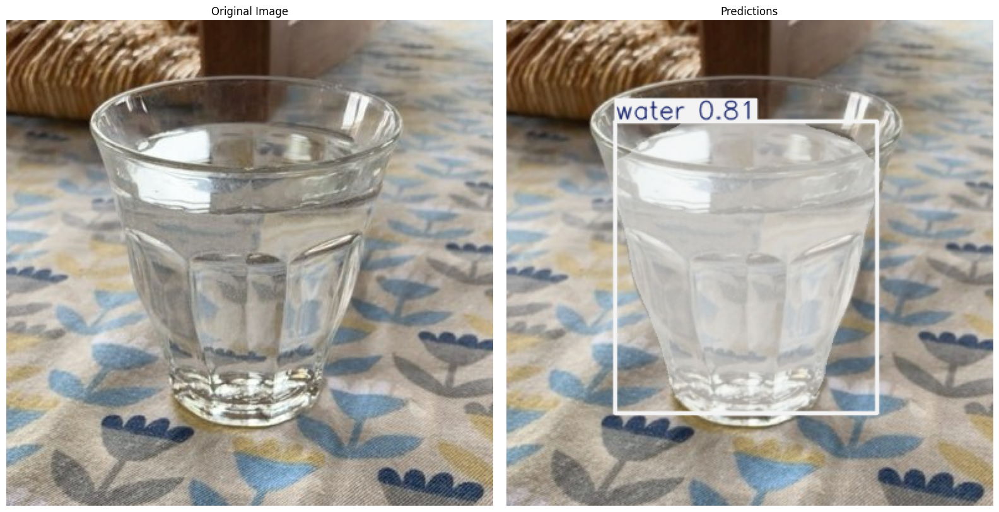

Image: 160632.jpg
  Detection 1: water (Confidence: 0.81)


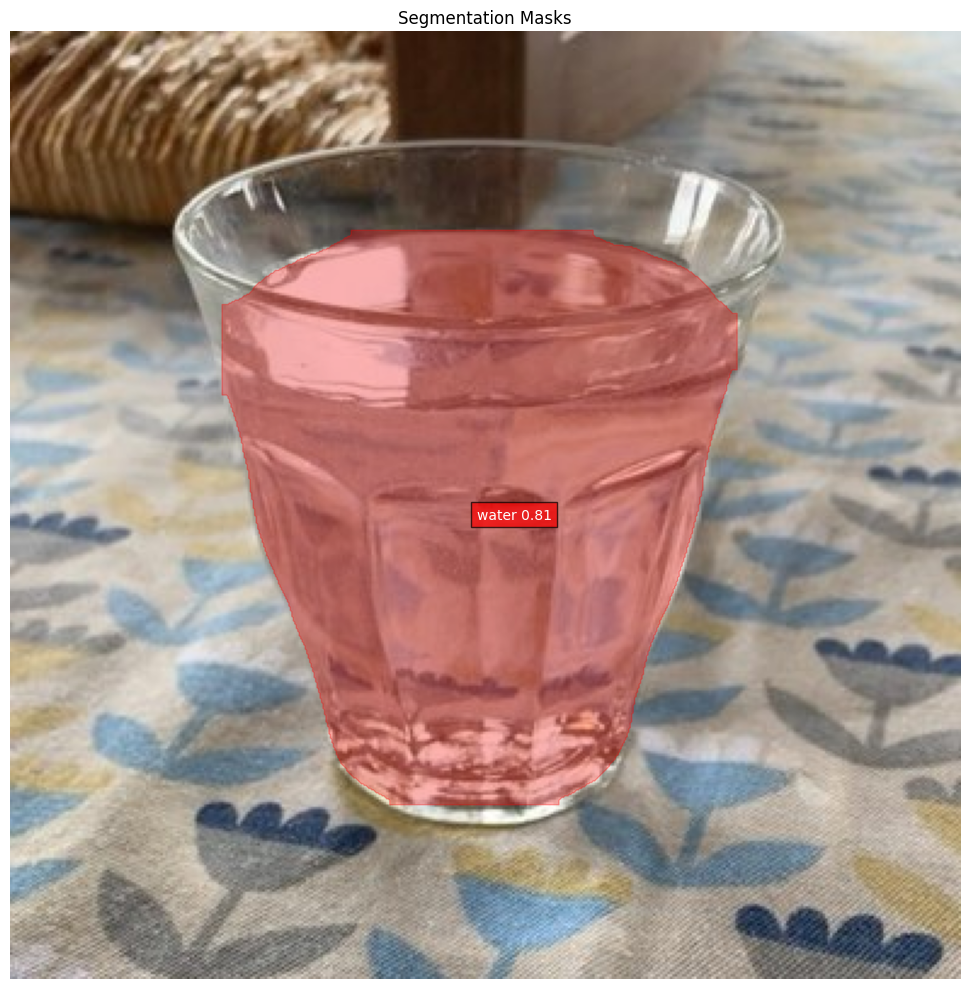

--------------------------------------------------

image 1/1 /home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/val/images/147560.jpg: 640x640 (no detections), 72.8ms
Speed: 1.5ms preprocess, 72.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Saved sample result to sample_result_147560.jpg


In [18]:
import os
from pathlib import Path
import cv2
from PIL import Image
import random

# Test model with test images from food-recognition-2022 dataset
import matplotlib.pyplot as plt

# Define the path to test images
TEST_DIR = Path("/home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/val/images")

# Verify that the directory exists
if not TEST_DIR.exists():
    print(f"Directory {TEST_DIR} does not exist!")
else:
    # Get a list of test images
    test_images = list(TEST_DIR.glob('*.jpg'))
    if not test_images:
        test_images = list(TEST_DIR.glob('*.png'))
    
    if not test_images:
        print(f"No image files found in {TEST_DIR}")
    else:
        print(f"Found {len(test_images)} test images")
        
        # Sample a few test images
        sample_size = min(5, len(test_images))
        sample_images = random.sample(test_images, sample_size)
        
        # Make predictions and visualize
        for img_path in sample_images:
            # Run inference
            results = model(img_path, conf=0.25)
            
            # Plot results
            fig, ax = plt.subplots(1, 2, figsize=(16, 8))
            
            # Original image
            img = Image.open(img_path)
            ax[0].imshow(img)
            ax[0].set_title('Original Image')
            ax[0].axis('off')
            
            # Predicted image with detections
            res_plotted = results[0].plot()
            res_plotted_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
            ax[1].imshow(res_plotted_rgb)
            ax[1].set_title('Predictions')
            ax[1].axis('off')
            
            plt.tight_layout()
            plt.show()
            
            # Print prediction details
            print(f"Image: {img_path.name}")
            for i, det in enumerate(results[0].boxes):
                label = results[0].names[int(det.cls)]
                conf = float(det.conf)
                print(f"  Detection {i+1}: {label} (Confidence: {conf:.2f})")
            
            # Show segmentation masks if available
            if hasattr(results[0], 'masks') and results[0].masks is not None:
                fig, ax = plt.subplots(1, 1, figsize=(10, 10))
                ax.imshow(img)
                ax.set_title('Segmentation Masks')
                ax.axis('off')
                
                # Plot each mask with different color
                colors = [(1, 0, 0, 0.3), (0, 1, 0, 0.3), (0, 0, 1, 0.3), 
                         (1, 1, 0, 0.3), (1, 0, 1, 0.3), (0, 1, 1, 0.3)]
                
                for i, mask in enumerate(results[0].masks.xy):
                    color_idx = i % len(colors)
                    cls_id = int(results[0].boxes.cls[i])
                    label = results[0].names[cls_id]
                    conf = float(results[0].boxes.conf[i])
                    
                    # Convert mask to numpy array if it's not already
                    mask_array = mask
                    # Plot mask as polygon
                    mask_polygon = plt.Polygon(mask_array, color=colors[color_idx])
                    ax.add_patch(mask_polygon)
                    
                    # Add label
                    centroid = mask_array.mean(axis=0)
                    ax.text(centroid[0], centroid[1], 
                           f"{label} {conf:.2f}", 
                           color='white', fontsize=10, 
                           bbox=dict(facecolor=colors[color_idx][:3], alpha=0.7))
                
                plt.tight_layout()
                plt.show()
            
            print("-" * 50)
            
        # Save a sample result
        if sample_images:
            result_img = model(sample_images[0], conf=0.25)[0].plot()
            output_path = f"sample_result_{sample_images[0].stem}.jpg"
            cv2.imwrite(output_path, result_img)
            print(f"Saved sample result to {output_path}")

## 11. Custom Inference Pipeline

Let's create a simple inference pipeline that can be used to process multiple images.

In [ ]:
def process_image_folder(model_path, image_folder, output_folder, conf_threshold=0.25):
    """
    Process all images in a folder and save visualization results
    
    Args:
        model_path: Path to the trained YOLO model
        image_folder: Folder containing images to process
        output_folder: Folder to save results
        conf_threshold: Confidence threshold for detections
    """
    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    # Load model
    model = YOLO(model_path)
    
    # Get all image files
    image_files = []
    for ext in ['.jpg', '.jpeg', '.png', '.bmp']:
        image_files.extend(list(Path(image_folder).glob(f'*{ext}')))
    
    # Process each image
    results_dict = {}
    
    for img_path in tqdm(image_files, desc="Processing images"):
        # Run inference
        results = model(img_path, conf=conf_threshold)
        
        # Save visualization
        result_img = results[0].plot()
        output_path = Path(output_folder) / f"{img_path.stem}_result{img_path.suffix}"
        cv2.imwrite(str(output_path), result_img)
        
        # Collect detection data
        detections = []
        for r in results:
            for i, (box, cls, conf) in enumerate(zip(r.boxes.xyxy, r.boxes.cls, r.boxes.conf)):
                class_name = model.names[int(cls)]
                detections.append({
                    'class': class_name,
                    'confidence': float(conf),
                    'bbox': box.tolist()
                })
        
        results_dict[img_path.name] = detections
    
    # Save results to JSON
    import json
    with open(Path(output_folder) / 'results.json', 'w') as f:
        json.dump(results_dict, f, indent=2)
    
    print(f"Processed {len(image_files)} images")
    print(f"Results saved to {output_folder}")
    
    return results_dict

# Example usage (commented out)
"""
TEST_FOLDER = "/home/kuba/Coding/Uczelnia/fridge_project/datasets/food-recognition-2022/test/images"
OUTPUT_FOLDER = "/home/kuba/Coding/Uczelnia/fridge_project/results"

# Use the trained model
detection_results = process_image_folder(
    model_path="/home/kuba/Coding/Uczelnia/fridge_project/food_segmentation_model.pt",
    image_folder=TEST_FOLDER,
    output_folder=OUTPUT_FOLDER,
    conf_threshold=0.3
)
"""

## Conclusion

In this notebook, we've:
1. Set up the environment for training a YOLOv11n-seg model
2. Configured and trained the model on our prepared food recognition dataset
3. Evaluated the model's performance on the validation set
4. Visualized the training progress and results
5. Demonstrated how to use the model for inference on new images
6. Exported the model for deployment
7. Created a custom inference pipeline for batch processing

The trained model can now be used for food recognition and instance segmentation tasks in your fridge project. You can further improve the model by:
- Fine-tuning hyperparameters
- Trying different YOLO model variants (e.g., YOLOv11s-seg, YOLOv11m-seg)
- Adding more training data or using data augmentation
- Implementing post-processing techniques for better segmentation

## 3.5 Memory Efficiency Strategies

Let's implement some techniques to reduce RAM usage and leverage disk storage more effectively during training.

In [ ]:
# Configure disk-based data handling
params.update({
    # Disk caching instead of RAM caching
    'cache': 'disk',  # Use disk for caching instead of RAM
    
    # Memory-efficient options
    'fraction': 1.0,  # Fraction of dataset to use (use <1.0 for even less memory)
    'overlap_mask': True,  # Use more efficient mask representation
    'mask_ratio': 4,  # Downsample masks for memory efficiency
    
    # Reduce batch size if needed
    'batch': 4,  # Smaller batch size
    
    # Enable gradient accumulation to simulate larger batches
    'accumulate': 4,  # Accumulate gradients over 4 batches
    
    # Save checkpoints less frequently to reduce disk I/O
    'save_period': 10,  # Save checkpoint every 10 epochs
    
    # Add mixed precision for memory efficiency
    'amp': True,  # Automatic mixed precision
    
    # Control workers for I/O efficiency
    'workers': 4,  # Reduce if I/O becomes a bottleneck
})

# For even more memory efficiency, you can reduce image size
# params['imgsz'] = 512  # Reduce from 640 to 512 if needed

print("Memory-efficient parameters:")
for k, v in params.items():
    if k in ['cache', 'batch', 'accumulate', 'amp', 'fraction', 'save_period', 'mask_ratio']:
        print(f"  {k}: {v}")

### Custom DataLoader for Disk-Efficient Training

For even more control over memory usage, we can implement a custom data loader that streams data from disk.

In [ ]:
def configure_memory_efficient_training():
    """
    Configure system for memory-efficient training
    """
    # Set environment variables to limit CUDA memory usage
    os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
    
    # Limit PyTorch threads
    import torch
    torch.set_num_threads(4)
    
    # Configure Python garbage collection to be more aggressive
    import gc
    gc.enable()
    
    # Optional: Control GPU memory growth
    if torch.cuda.is_available():
        # Empty cache
        torch.cuda.empty_cache()
        
        # Optional: Set memory fraction (adjust as needed)
        # device = torch.cuda.current_device()
        # torch.cuda.set_per_process_memory_fraction(0.8, device)
        
        # Print available memory
        print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB total")
        free_mem = torch.cuda.memory_reserved(0) - torch.cuda.memory_allocated(0)
        print(f"GPU Memory available: {free_mem / 1e9:.2f} GB")
    
    # Check available system memory
    import psutil
    vm = psutil.virtual_memory()
    print(f"System RAM: {vm.total / 1e9:.2f} GB total, {vm.available / 1e9:.2f} GB available")
    
    return True

# Install psutil if needed
try:
    import psutil
except ImportError:
    !pip install psutil
    import psutil

# Configure memory settings before training
configure_memory_efficient_training()

### Custom Checkpoint Saving Strategy

We can create a custom callback for efficient checkpointing that minimizes both disk and memory usage.

In [ ]:
# Define a custom callback function for efficient checkpointing
def create_checkpoint_callback():
    """
    Creates a custom checkpoint callback that only saves essential info
    """
    class EfficientCheckpoint:
        def __init__(self, save_dir, period=10):
            self.save_dir = Path(save_dir)
            self.period = period
            self.save_dir.mkdir(parents=True, exist_ok=True)
            self.best_fitness = 0
            self.epoch = 0
        
        def __call__(self, trainer):
            self.epoch += 1
            if self.epoch % self.period != 0 and not trainer.epoch == trainer.epochs - 1:
                return
            
            ckpt = {
                'epoch': trainer.epoch,
                'best_fitness': trainer.best_fitness,
                'model': trainer.model.state_dict(),
                'optimizer': None,  # Don't save optimizer state to save space
                'ema': None if not hasattr(trainer, 'ema') else trainer.ema.ema.state_dict(),
                'updates': None if not hasattr(trainer, 'ema') else trainer.ema.updates,
                'fitness': trainer.fitness,
                'date': datetime.now().isoformat()
            }
            
            # Save checkpoint
            torch.save(ckpt, self.save_dir / f'epoch_{trainer.epoch}.pt')
            
            # Save best model (overwrite)
            if trainer.fitness > self.best_fitness:
                self.best_fitness = trainer.fitness
                torch.save(ckpt, self.save_dir / 'best.pt')
            
            # Clean old checkpoints to free disk space
            ckpts = sorted(self.save_dir.glob('epoch_*.pt'))
            if len(ckpts) > 3:  # Keep only the 3 most recent checkpoints
                for old_ckpt in ckpts[:-3]:
                    old_ckpt.unlink()
    
    # This callback would need to be integrated with the trainer
    # In practice, with ultralytics, we can adjust the save_period parameter
    return EfficientCheckpoint(save_dir=Path(OUTPUT_DIR) / 'weights')

# Note: Currently, YOLO doesn't support custom callbacks easily
# But we're demonstrating how you might approach this in a custom pipeline
# Instead, we'll rely on YOLO's built-in parameters